<a href="https://colab.research.google.com/github/ashishpatel26/SRCNN_Step_by_Step/blob/main/SRCNN_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import os
import shutil
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
from keras.models import load_model
from sklearn.model_selection import train_test_split
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Add
from keras.models import Model
import keras.backend as K
from keras.optimizers import Adam
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, CSVLogger

%matplotlib inline

In [2]:
shutil.unpack_archive('/content/train.zip', extract_dir=".")

In [3]:
def load_images(inputdir, inputpath, imagesize):
    imglist = []
    
    for i in range(len(inputpath)):
        img = cv2.imread(inputdir+inputpath[i], cv2.IMREAD_COLOR) 
        img=cv2.resize(img,(128,128))
        img = img[::-1] 
        imglist.append(img)
        
    return imglist

In [4]:
IMAGE_SIZE = 128

image_path = sorted(os.listdir("/content/train"))


image =load_images("/content/train/", image_path, IMAGE_SIZE)
 
image /= np.max(image)

image.shape

(90, 128, 128, 3)

In [5]:
label= np.zeros((90,128,128,3), np.float32)
for i in range(image.shape[0]):
    temp=cv2.resize(image[i,:,:,:],(64,64))
    temp=cv2.resize(temp,(128,128))
    label[i,:,:,:]=temp
label.shape

(90, 128, 128, 3)

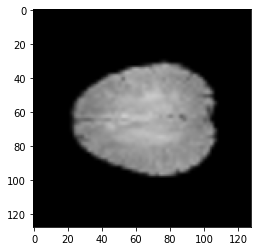

In [6]:
plt.imshow(label[0])

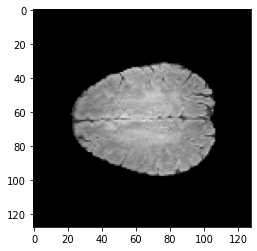

In [7]:
plt.imshow(image[0])

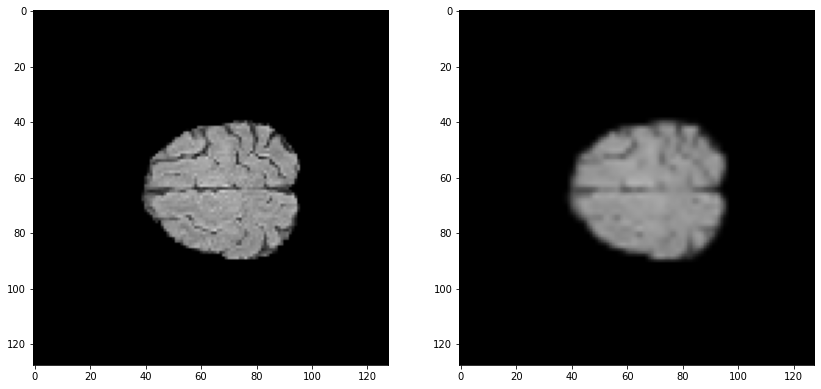

In [8]:
num = 20

plt.figure(figsize=(14, 7))

ax = plt.subplot(1, 2, 1)
plt.imshow(np.squeeze(image[num]))

ax = plt.subplot(1, 2, 2)
plt.imshow(np.squeeze(label[num]))
plt.show()

In [9]:
def SRCNN():
    input_img = Input(shape=(IMAGE_SIZE,IMAGE_SIZE,3))
    
    enc1 = Conv2D(64,kernel_size=3,activation="relu",padding="same")(input_img)
    enc1 = Conv2D(64,kernel_size=3,activation="relu",padding="same")(enc1)
    down1 = MaxPooling2D(pool_size=2)(enc1)

    enc2 = Conv2D(128,kernel_size=3,activation="relu",padding="same")(down1)
    enc2 = Conv2D(128,kernel_size=3,activation="relu",padding="same")(enc2)
    down2 = MaxPooling2D(pool_size=2)(enc2)
    
    enc3 = Conv2D(256,kernel_size=3,activation="relu",padding="same")(down2)
    
    up3 = UpSampling2D(size=2)(enc3)
    dec3 = Conv2D(128,kernel_size=3,activation="relu",padding="same")(up3)
    dec3 = Conv2D(128,kernel_size=3,activation="relu",padding="same")(dec3)
    
    add2 = Add()([dec3,enc2])
    up2 = UpSampling2D(size=2)(add2)
    dec2 = Conv2D(64,kernel_size=3,activation="relu",padding="same")(up2)
    dec2 = Conv2D(64,kernel_size=3,activation="relu",padding="same")(dec2)
    
    add1 = Add()([dec2,enc1])
    dec1 = Conv2D(3,kernel_size=5,activation="linear",padding="same")(add1)
    
    model = Model(input_img,dec1)
    return model

model = SRCNN()
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 128, 128, 64) 1792        input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 128, 128, 64) 36928       conv2d[0][0]                     
__________________________________________________________________________________________________
max_pooling2d (MaxPooling2D)    (None, 64, 64, 64)   0           conv2d_1[0][0]                   
______________________________________________________________________________________________

In [10]:
initial_learningrate=2e-3
    
def lr_decay(epoch):
    if epoch < 500:
        return initial_learningrate
    else:
        return initial_learningrate * 0.99 ** epoch


def psnr(y_true,y_pred):
    return -10*K.log(K.mean(K.flatten((y_true-y_pred))**2))/np.log(10)

# Loss functtion
def ssim_loss(y_true, y_pred):
  return tf.reduce_mean(tf.image.ssim(y_true, y_pred, 2.0))

CSV_Logger = CSVLogger('training.csv')
model.compile(loss="mean_squared_error",optimizer=Adam(lr=initial_learningrate),metrics=[psnr, ssim_loss])

model.fit(label,image,epochs=1000,batch_size=32,verbose=1,callbacks=[LearningRateScheduler(lr_decay,verbose=1), CSV_Logger])

In [11]:
# model.save('SRCNN.h5')
model.load_weights('SRCNN.h5')
results = model.predict(image,verbose=1)

3/3 [==============================] - 8s 1s/step


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_100.png


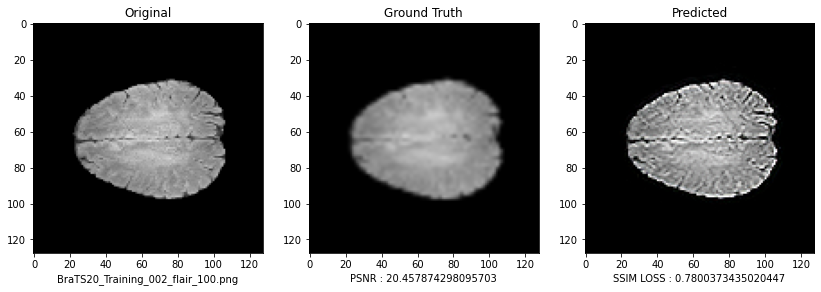

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_101.png


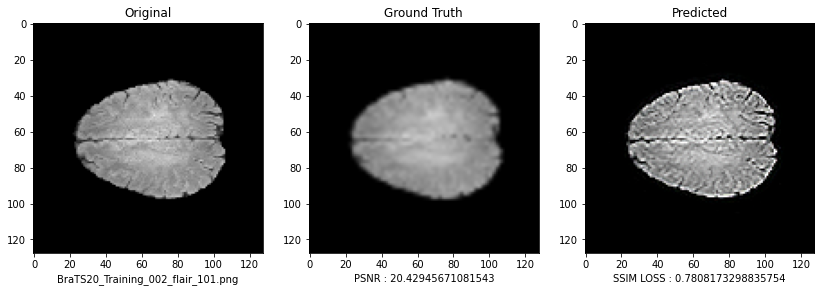

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_102.png


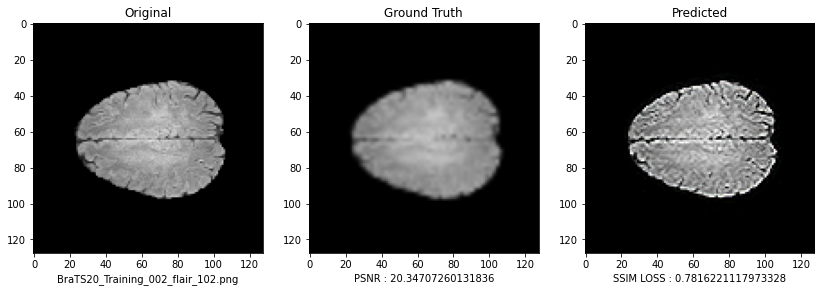

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_103.png


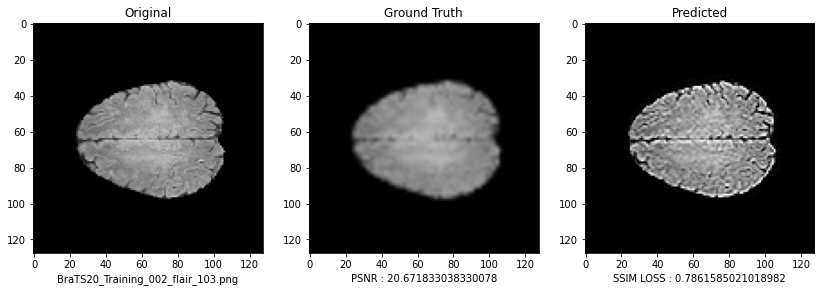

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_104.png


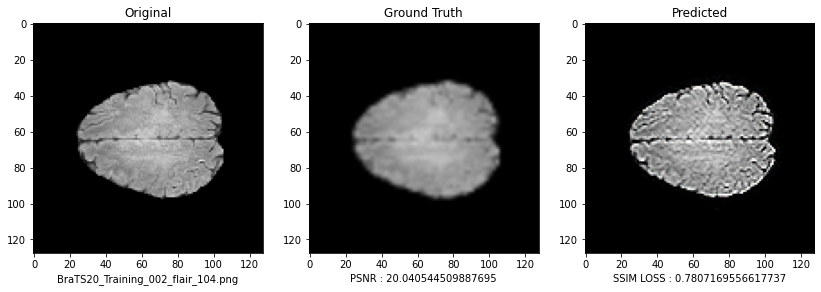

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_105.png


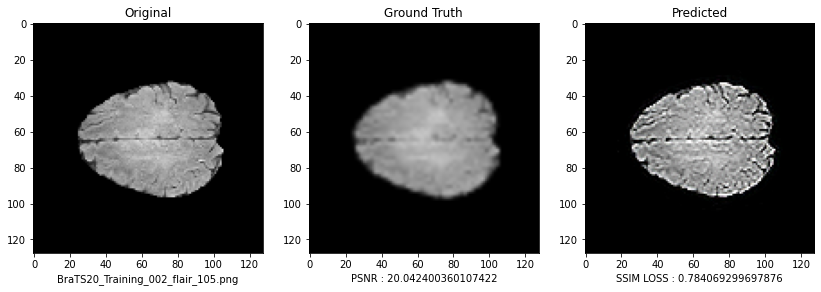

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_106.png


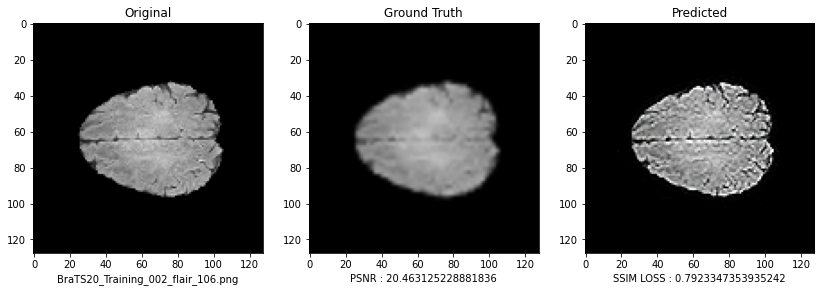

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_107.png


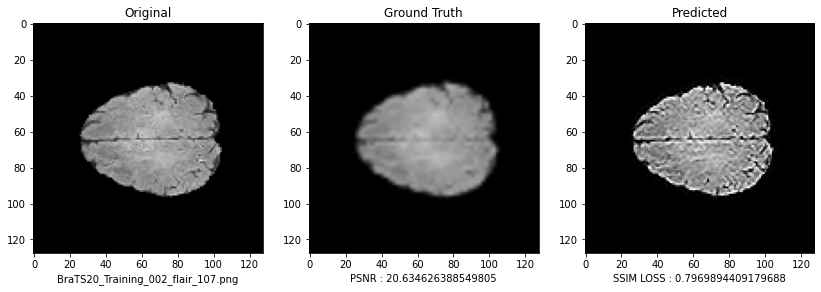

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_108.png


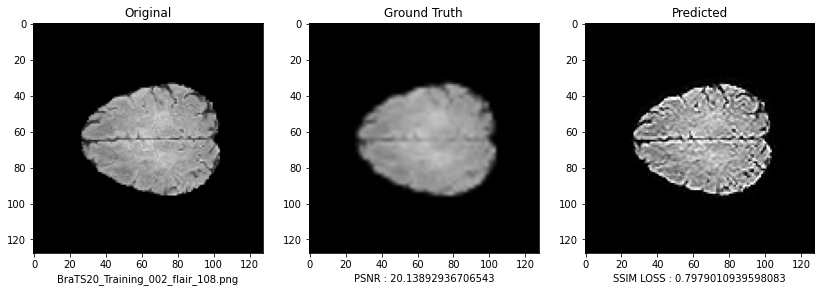

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_109.png


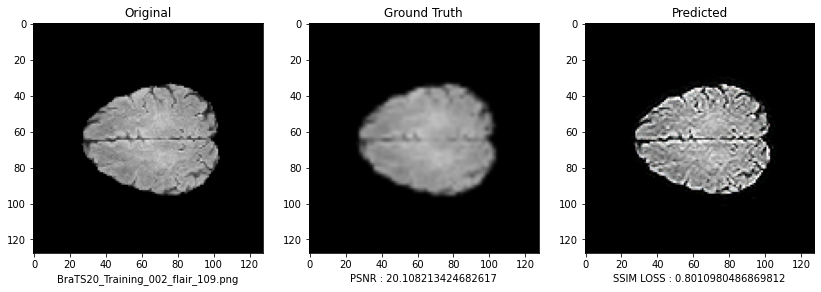

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_110.png


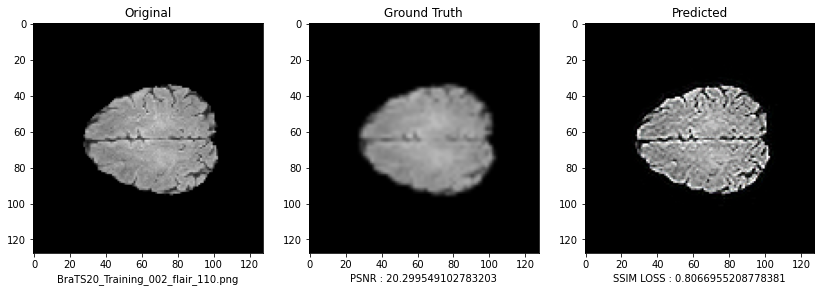

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_111.png


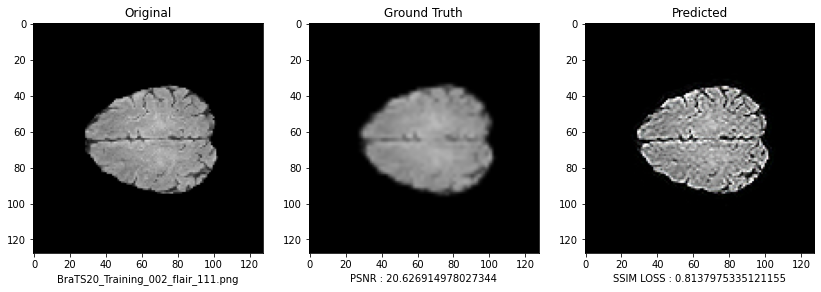

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_112.png


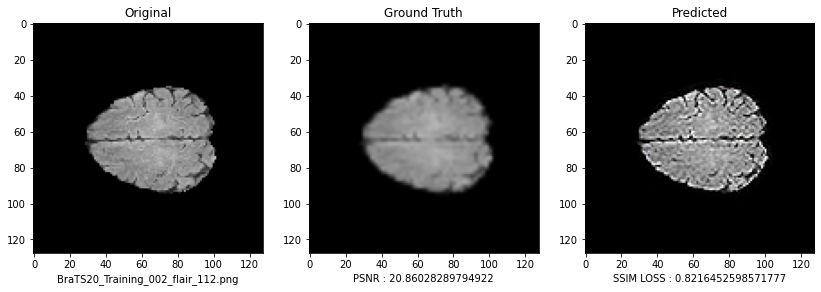

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_113.png


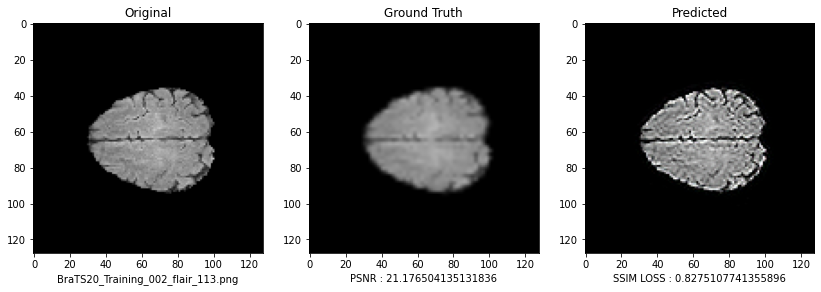

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_114.png


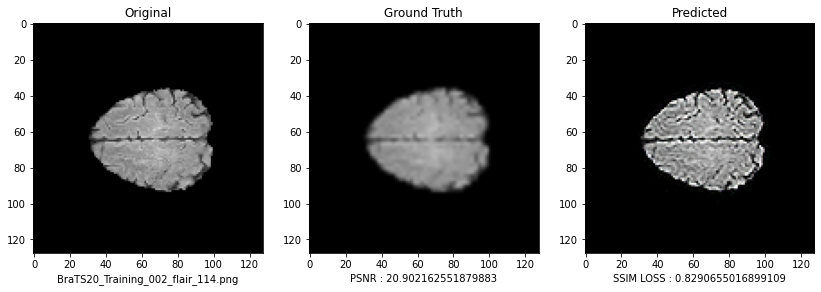

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_115.png


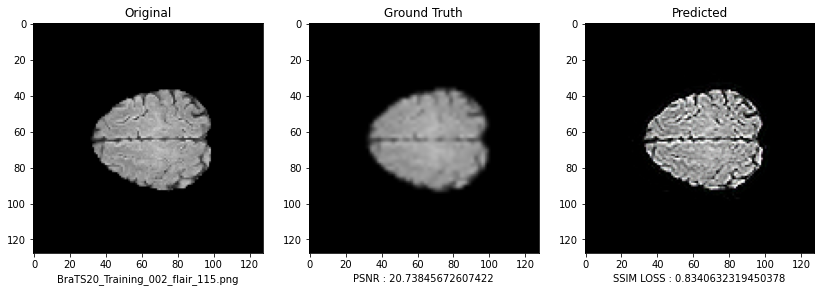

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_116.png


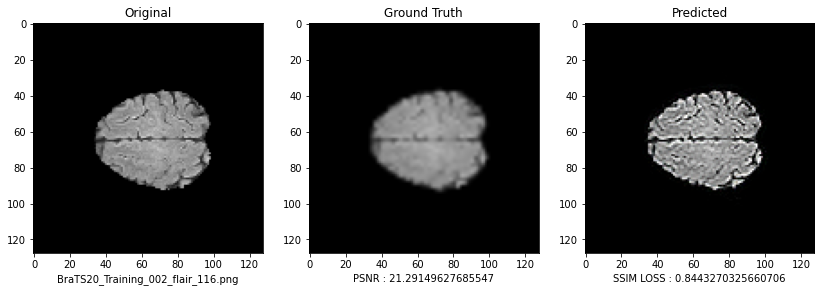

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_117.png


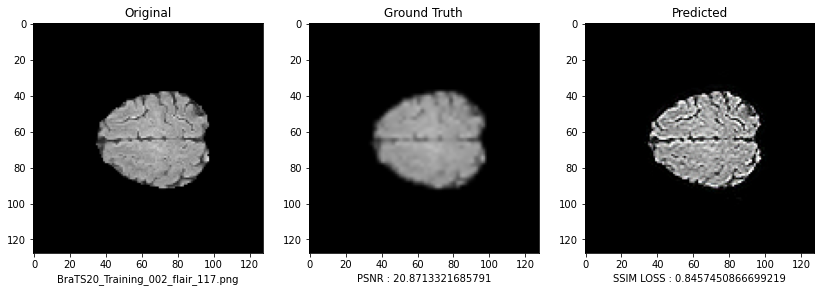

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_118.png


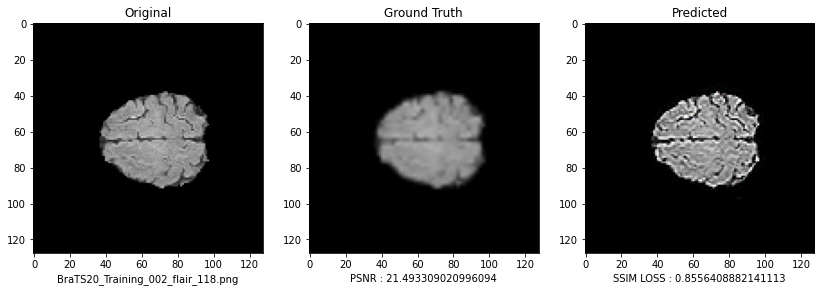

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_119.png


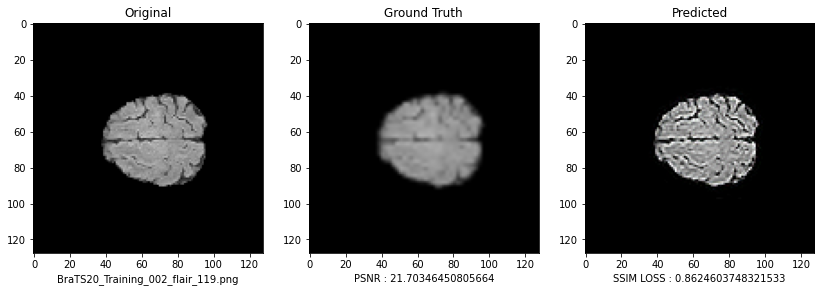

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_120.png


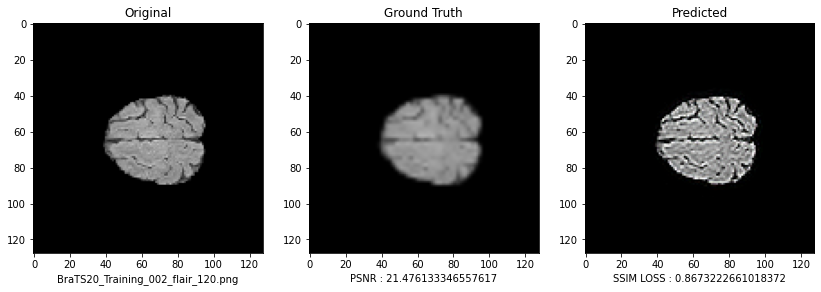

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_121.png


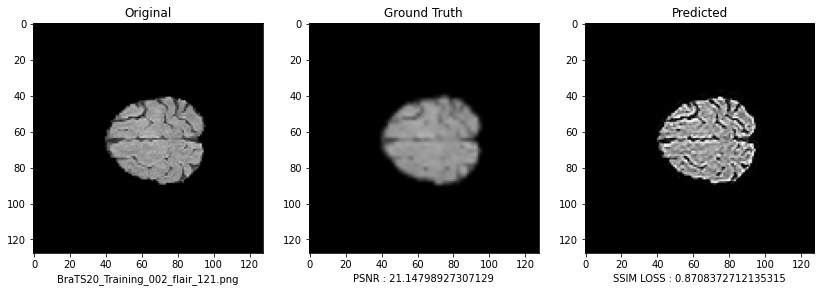

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_122.png


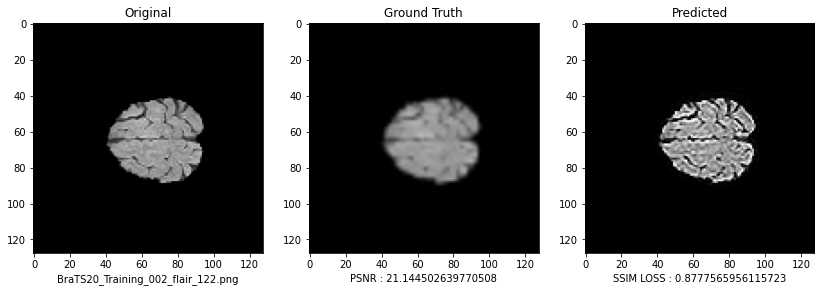

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_33.png


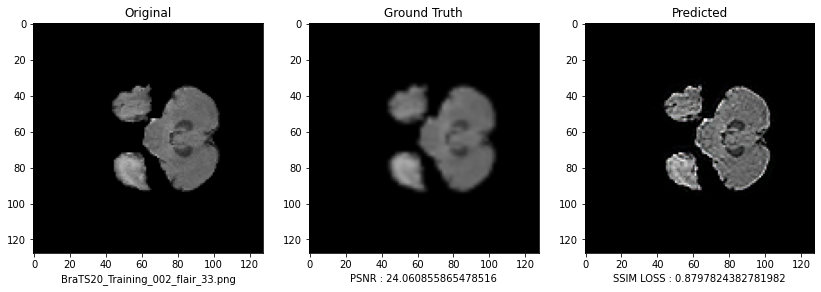

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_34.png


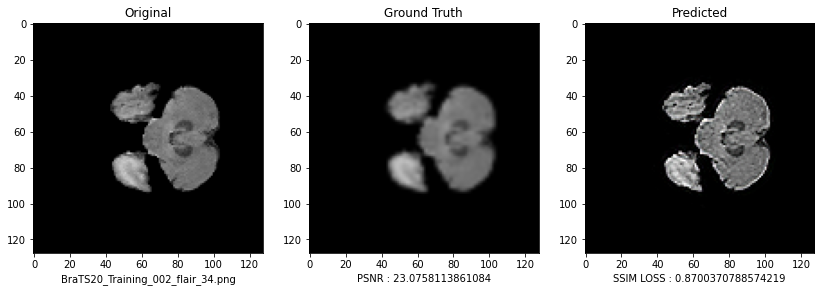

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_35.png


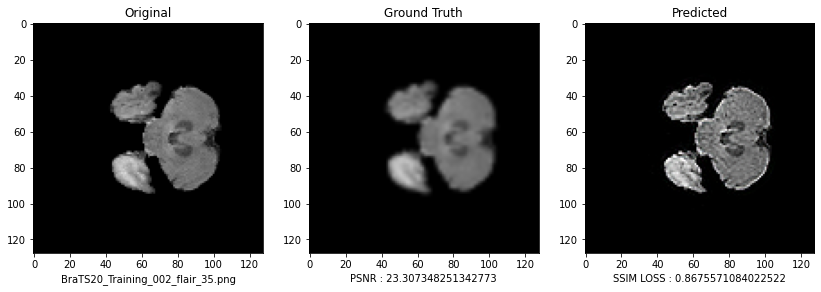

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_36.png


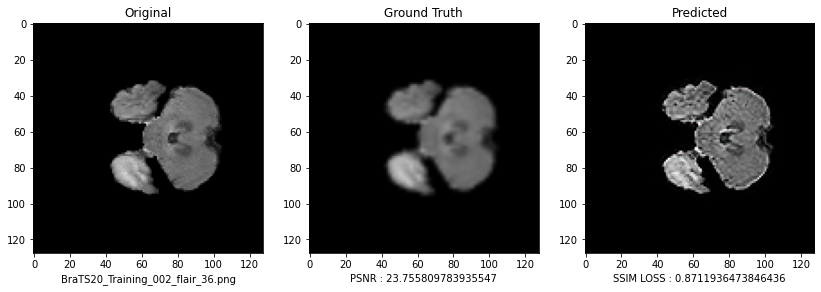

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_37.png


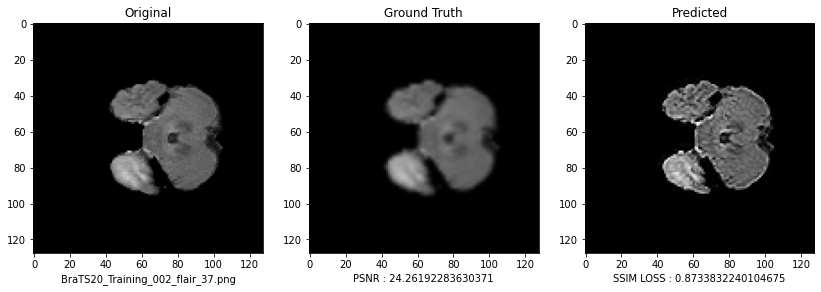

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_38.png


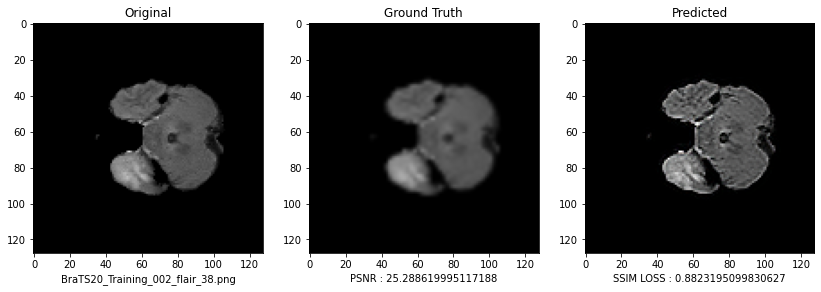

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_39.png


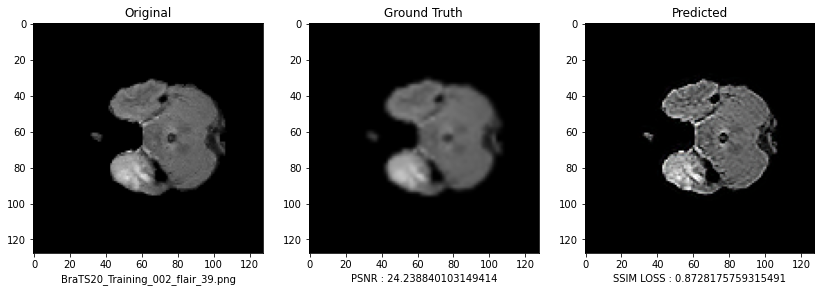

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_40.png


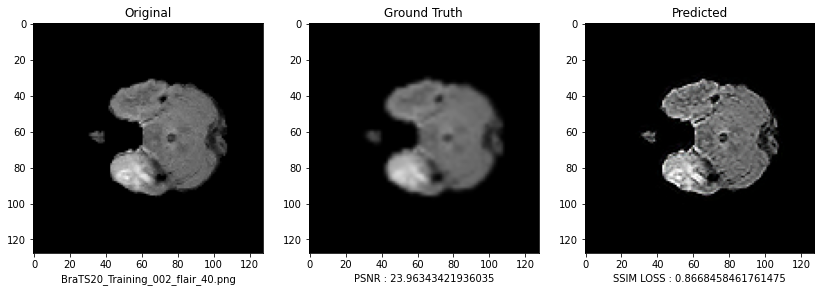

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_41.png


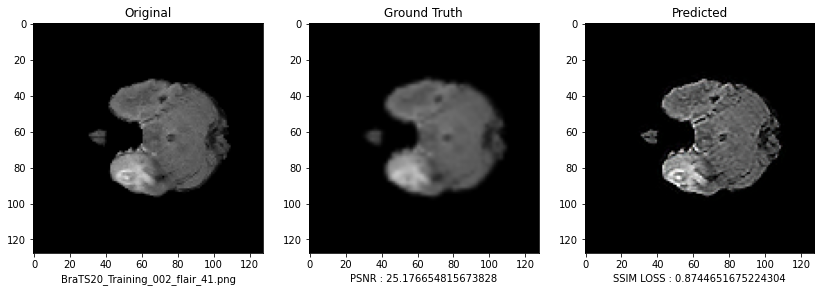

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_42.png


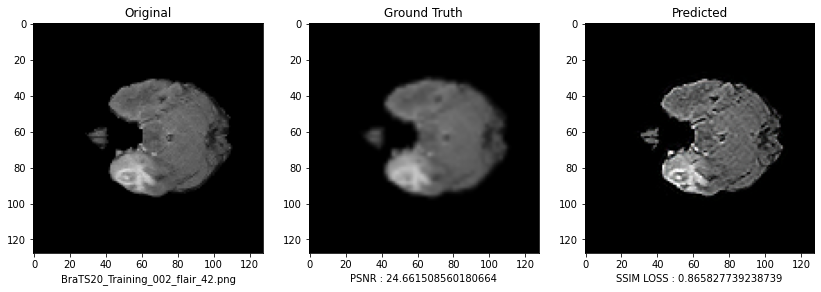

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_43.png


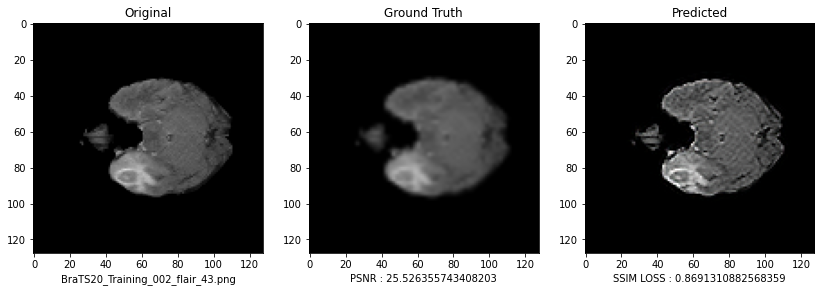

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_44.png


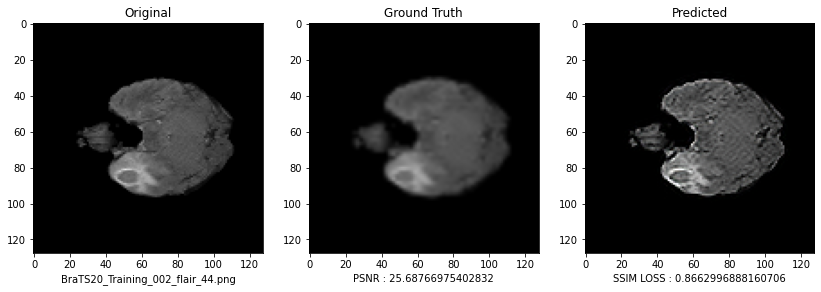

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_45.png


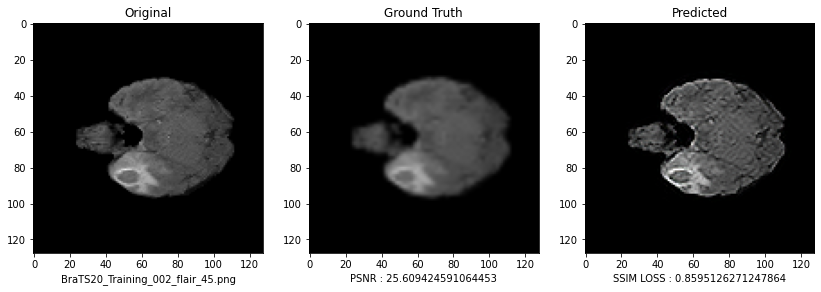

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_46.png


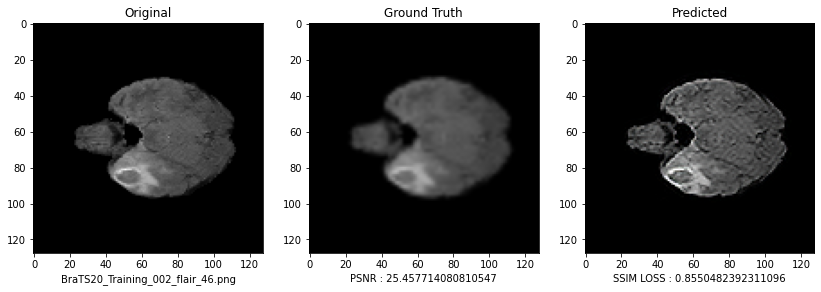

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_47.png


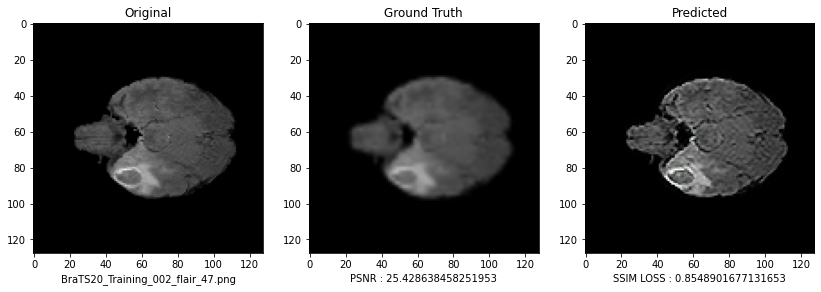

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_48.png


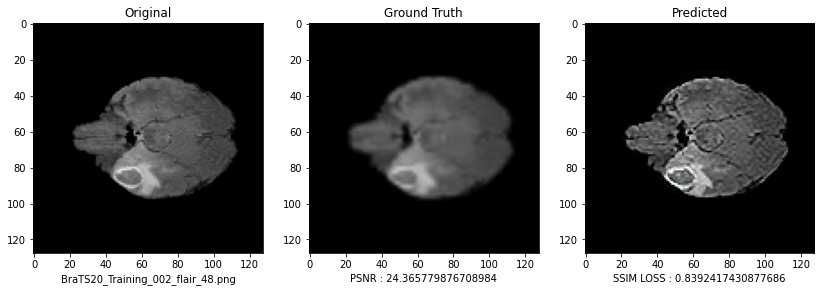

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_49.png


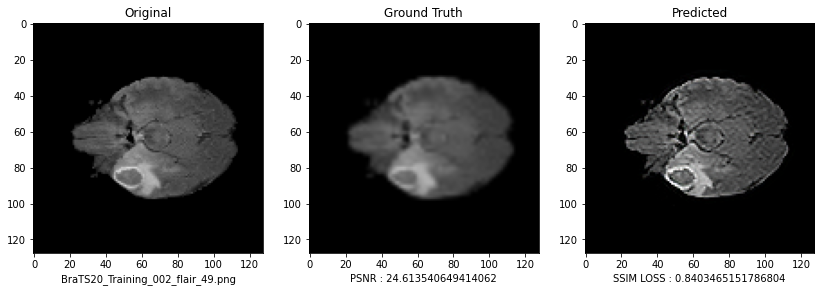

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_50.png


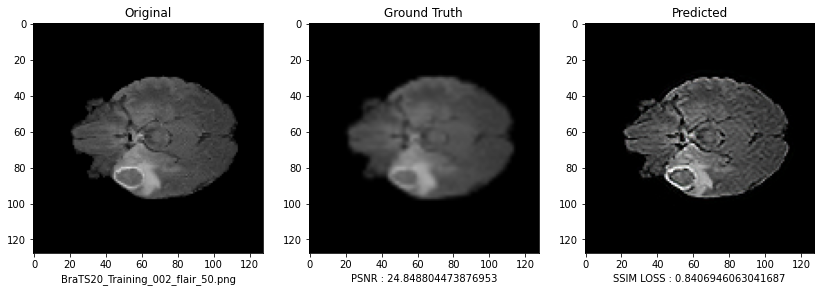

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_51.png


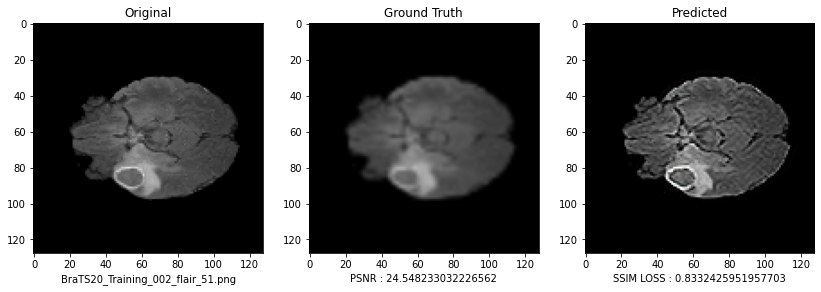

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_52.png


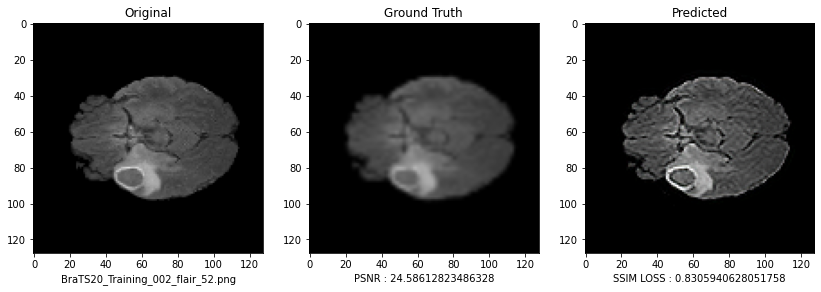

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_53.png


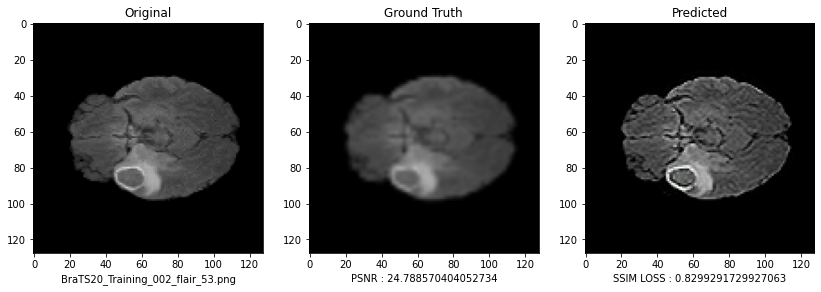

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_54.png


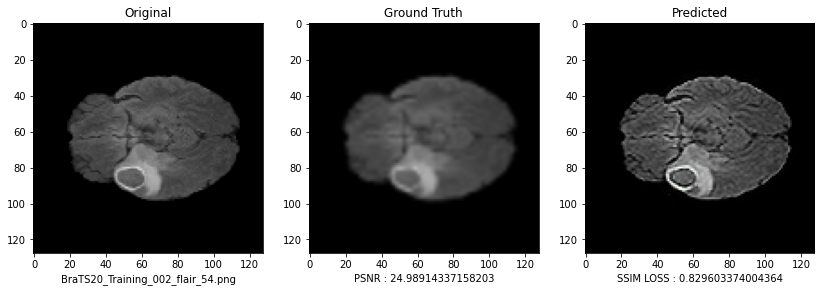

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_55.png


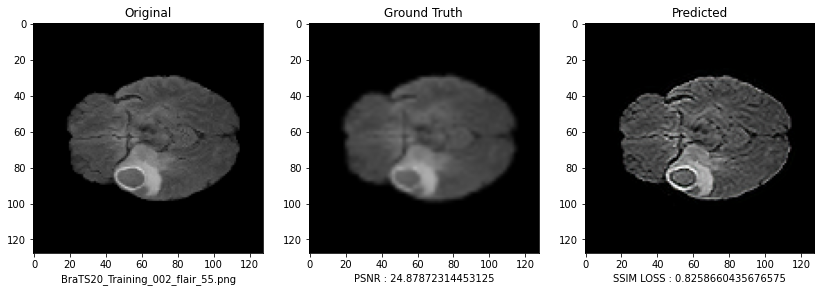

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_56.png


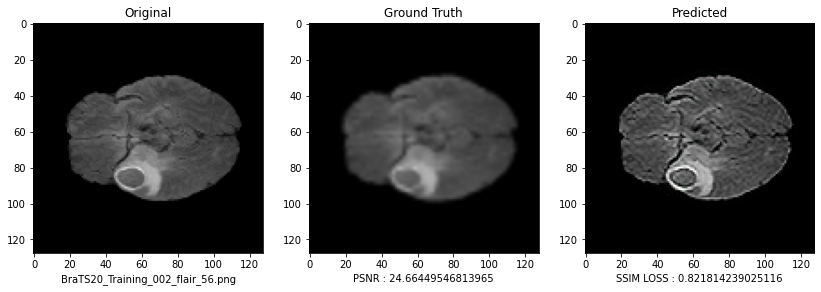

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_57.png


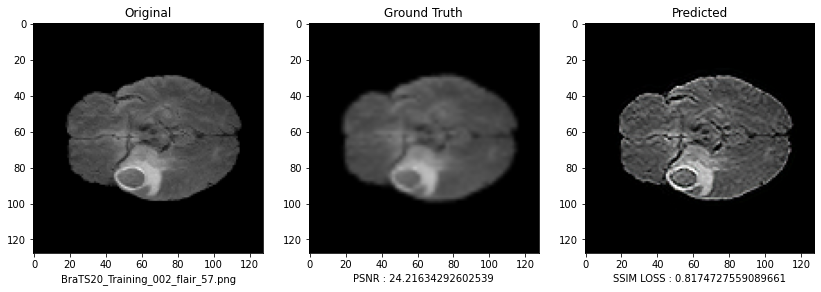

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_58.png


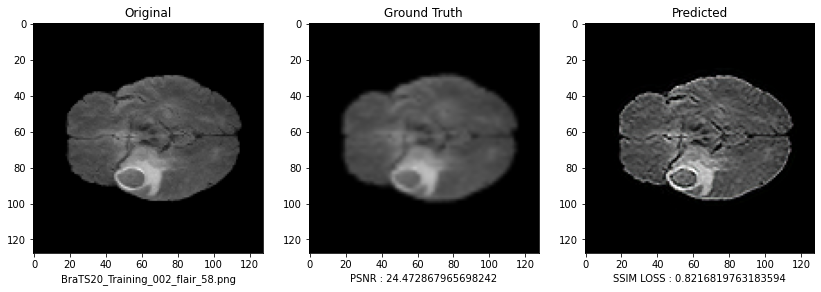

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_59.png


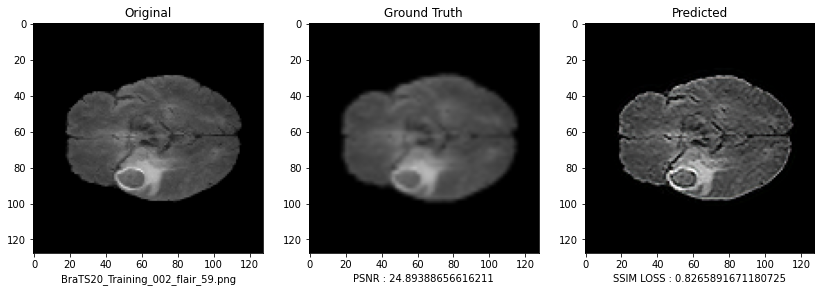

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_60.png


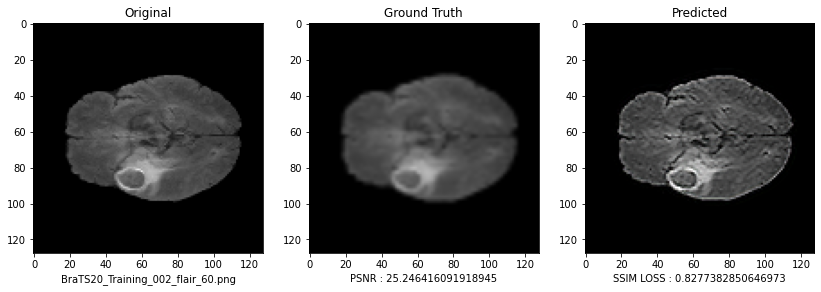

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_61.png


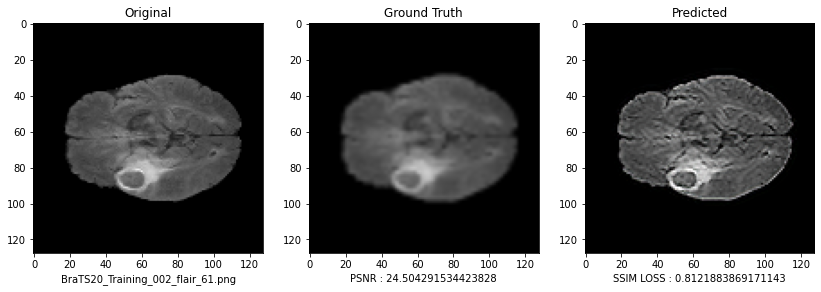

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_62.png


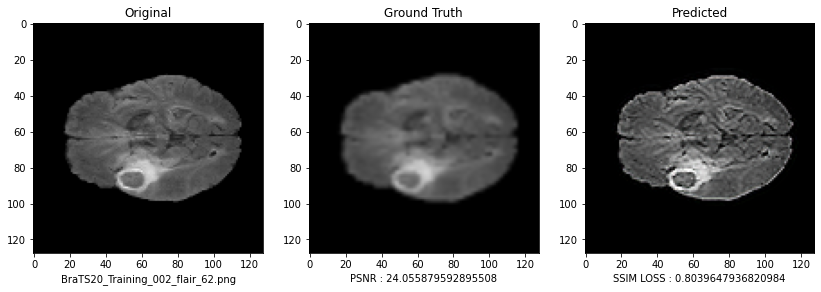

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_63.png


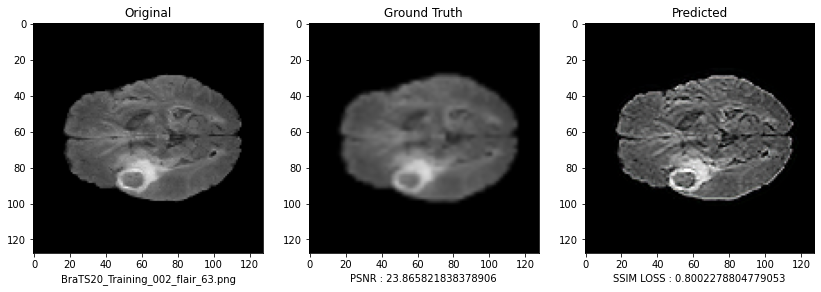

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_64.png


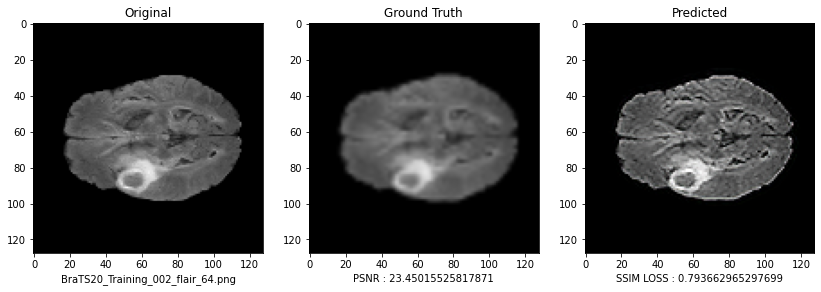

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_65.png


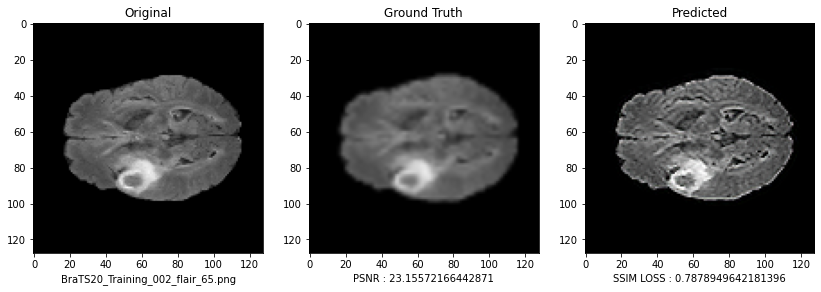

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_66.png


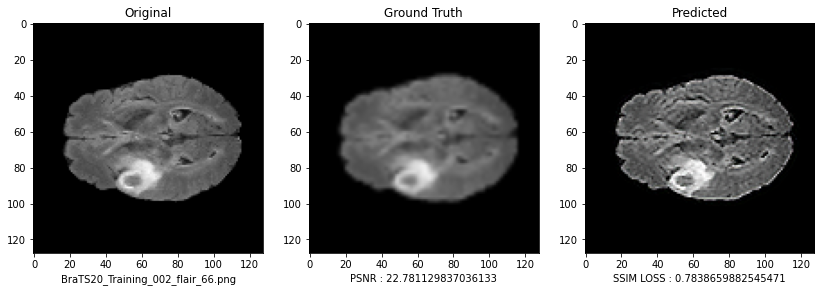

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_67.png


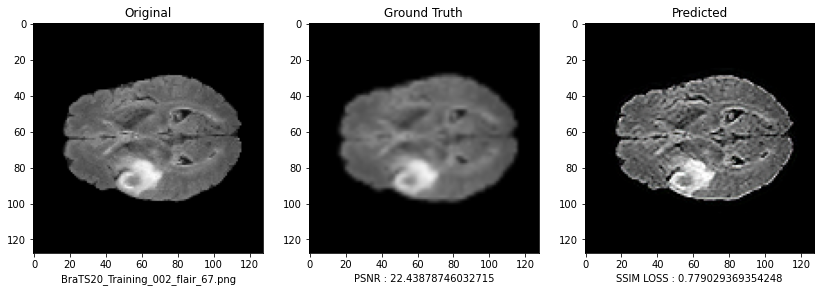

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_68.png


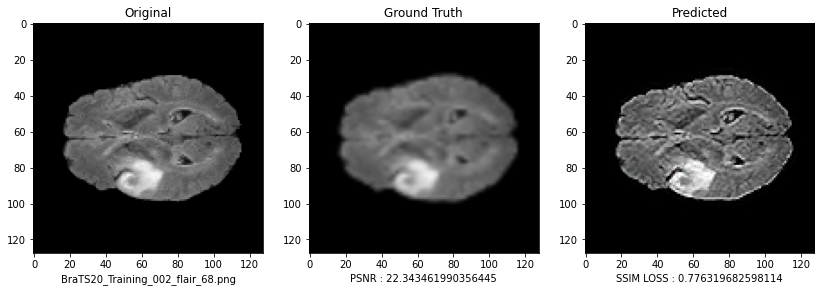

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_69.png


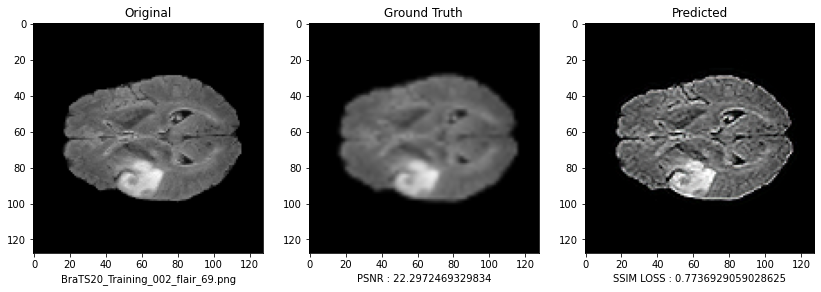

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_70.png


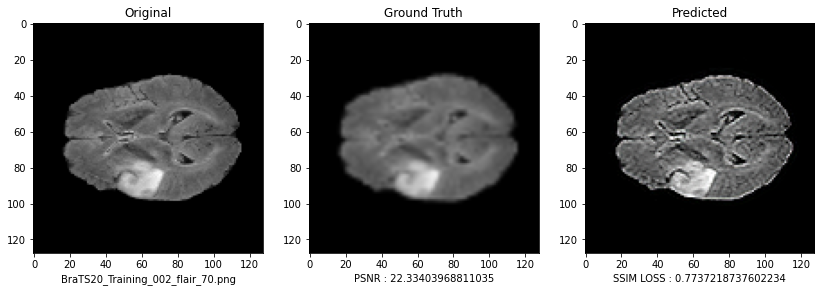

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_71.png


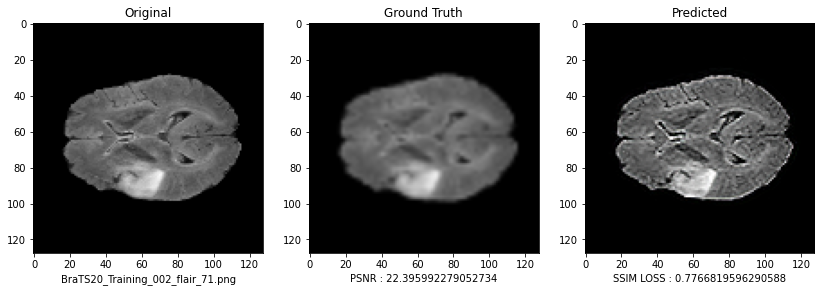

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_72.png


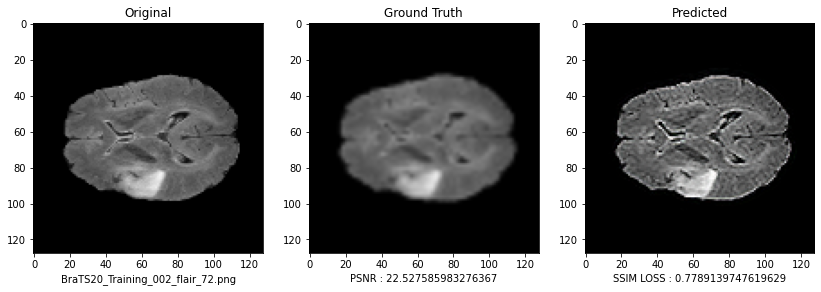

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_73.png


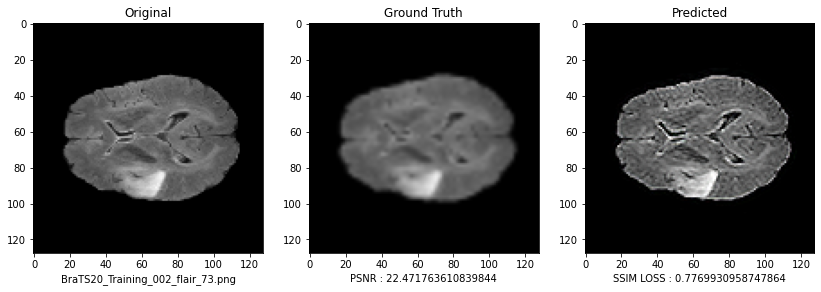

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_74.png


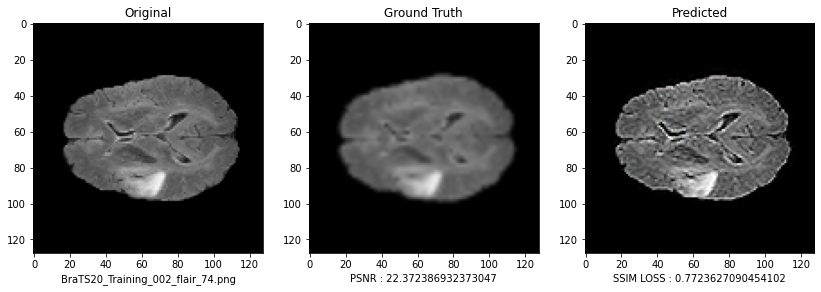

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_75.png


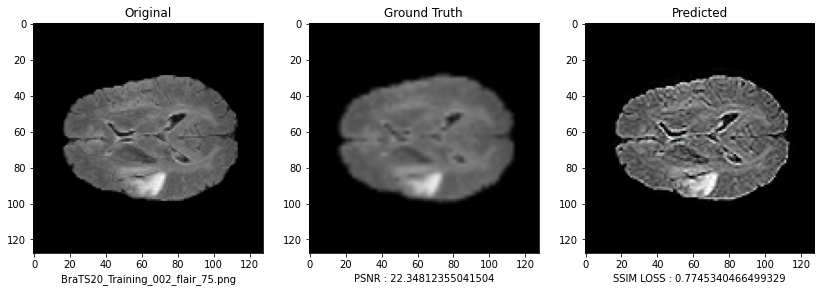

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_76.png


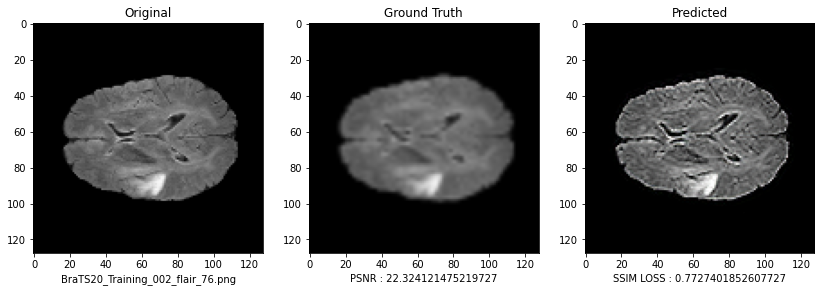

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_77.png


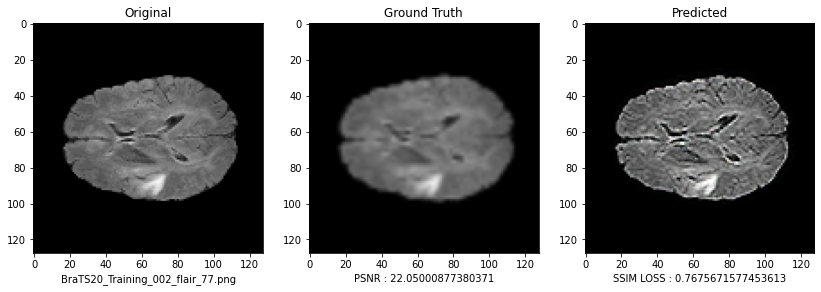

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_78.png


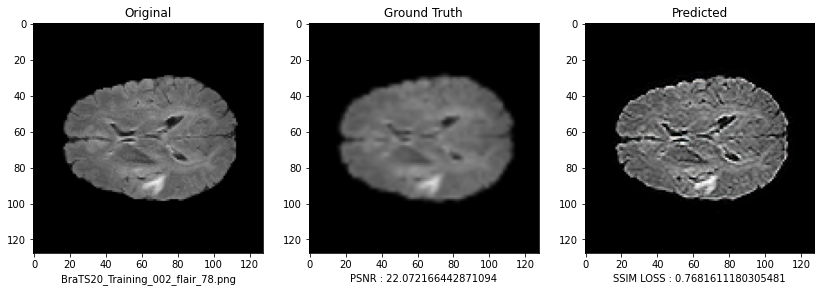

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_79.png


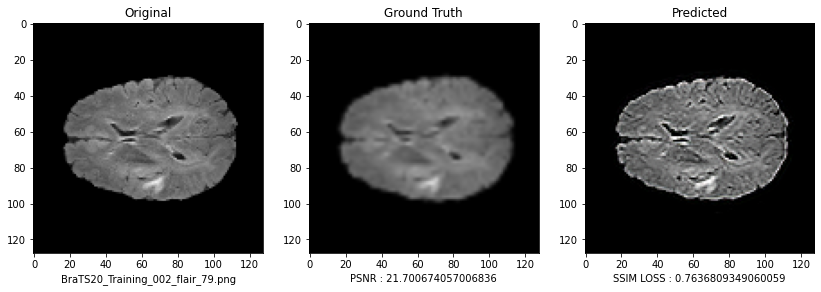

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_80.png


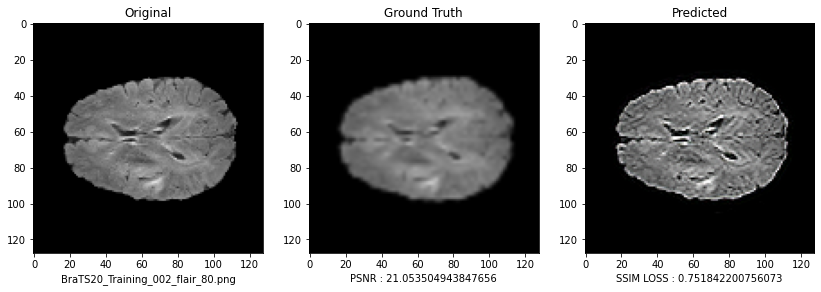

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_81.png


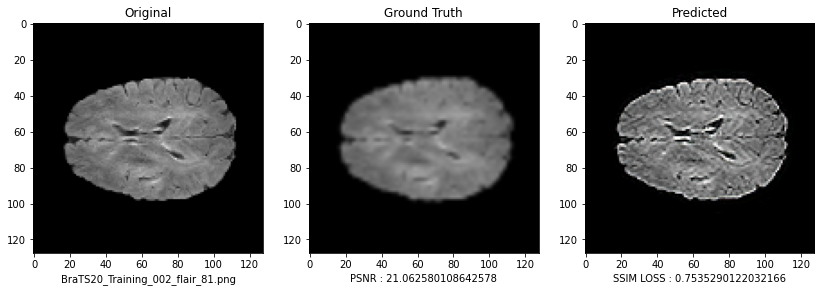

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_82.png


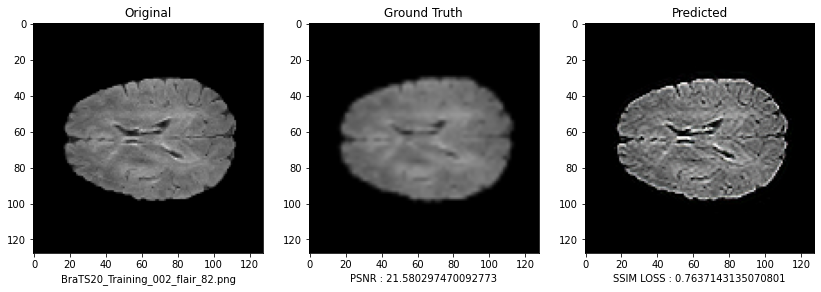

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_83.png


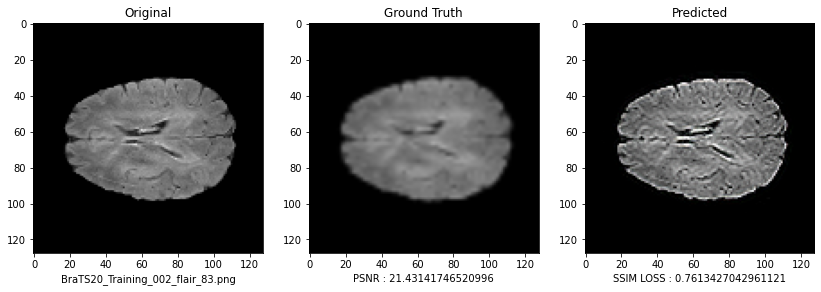

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_84.png


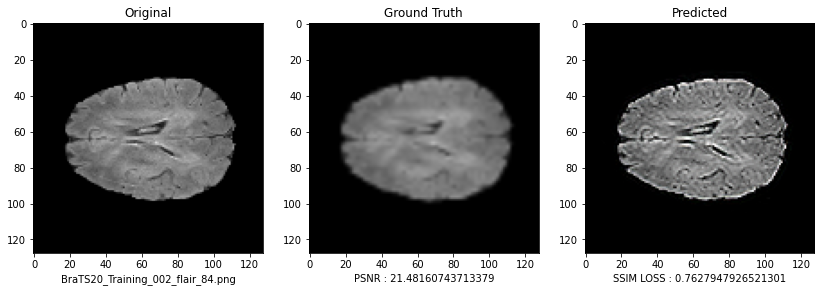

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_85.png


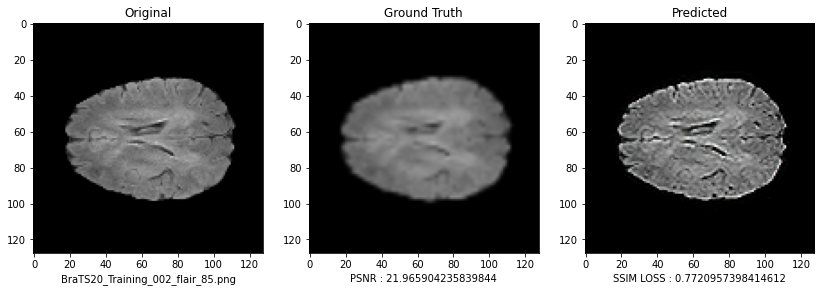

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_86.png


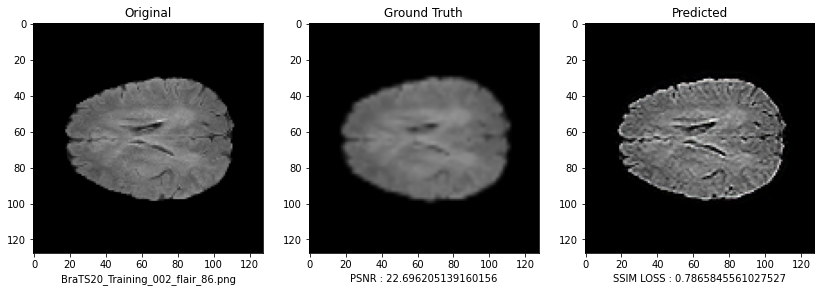

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_87.png


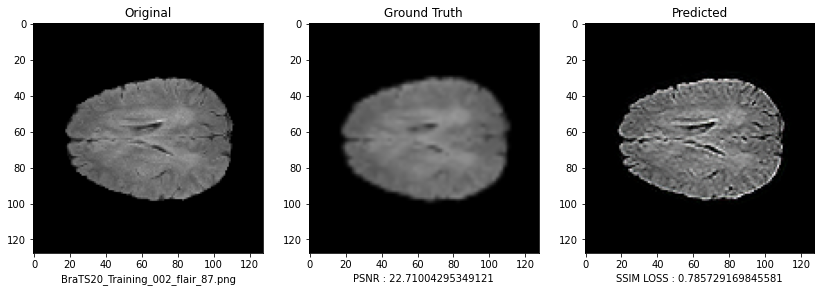

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_88.png


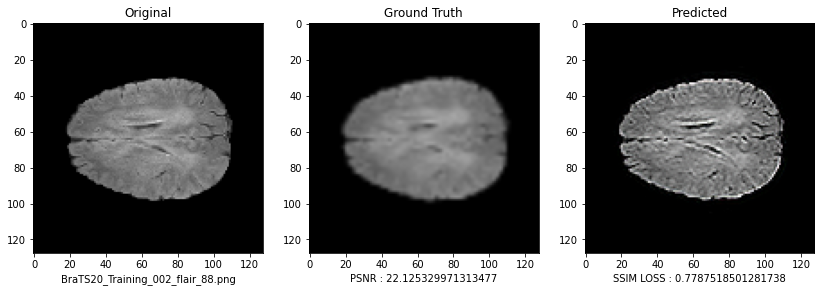

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_89.png


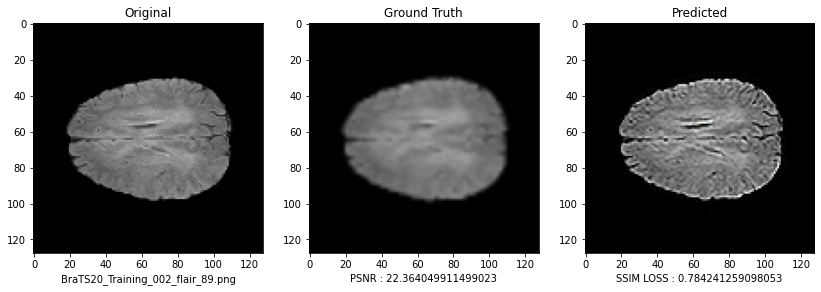

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_90.png


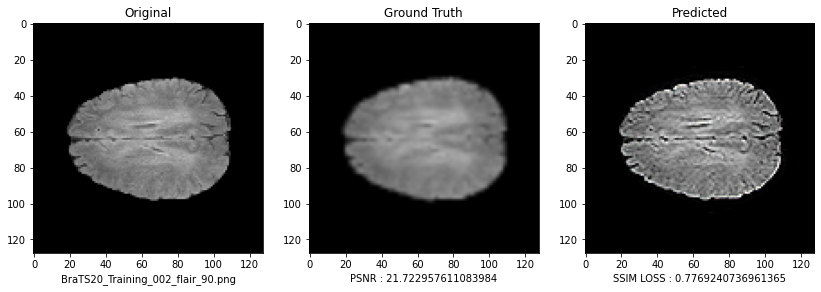

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_91.png


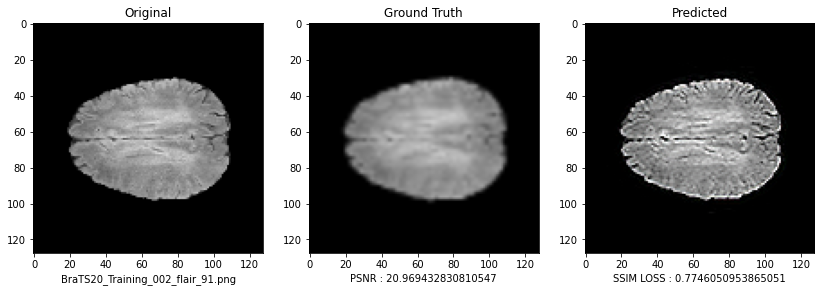

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_92.png


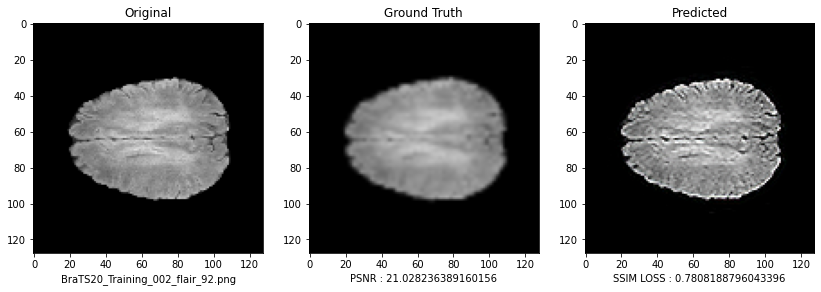

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_93.png


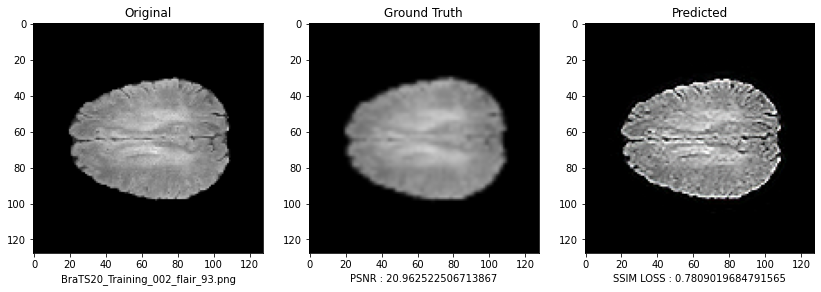

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_94.png


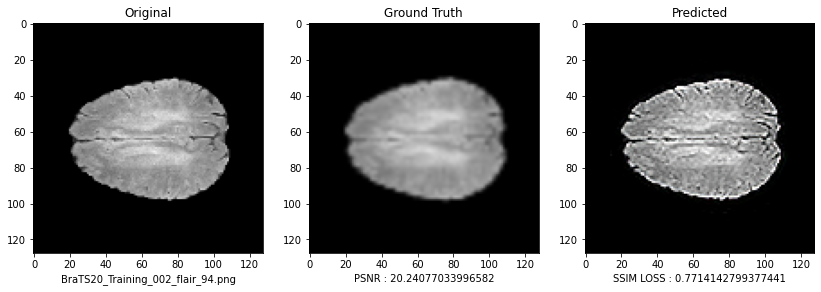

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_95.png


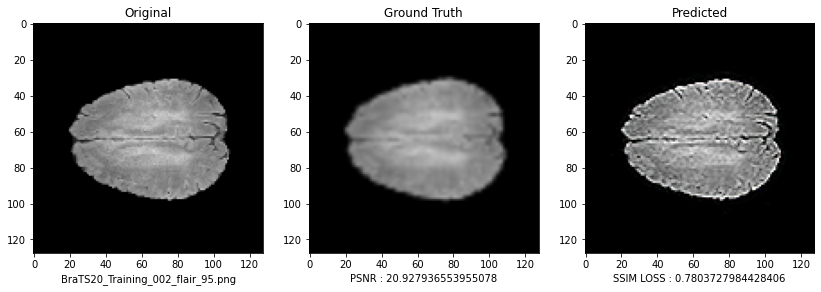

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_96.png


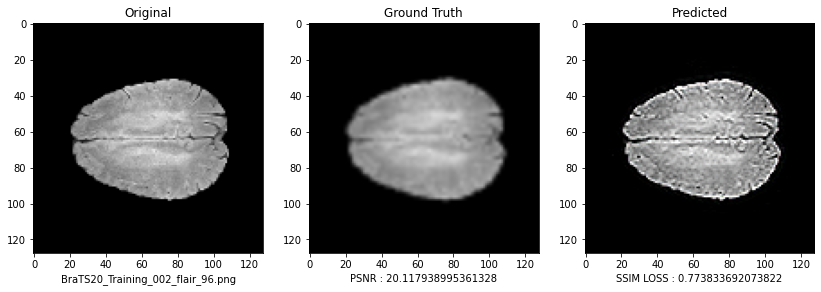

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_97.png


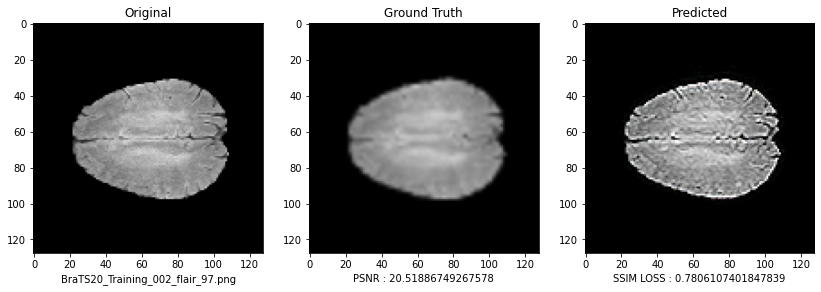

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_98.png


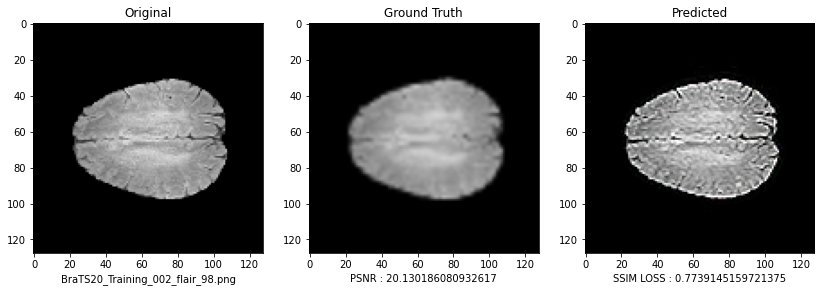

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image : BraTS20_Training_002_flair_99.png


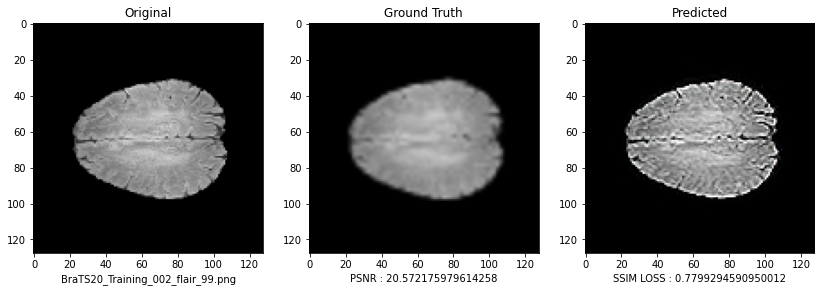

In [14]:
from google.colab.patches import cv2_imshow
predict_result_analysis = {}
predict_result_analysis["Name"] = []
predict_result_analysis["psnr"] = []
predict_result_analysis["ssim_loss"] = []
for i, name in zip(range(results.shape[0]), image_path):
  print(f"Image : {name}")
  plt.figure(figsize=(14, 7))
  ax = plt.subplot(1, 3, 3)
  plt.imshow(np.squeeze(results[i]))
  plt.xlabel(f"SSIM LOSS : {ssim_loss(label[i], results[i])}")
  plt.title("Predicted")

  ax = plt.subplot(1, 3, 2)
  plt.imshow(np.squeeze(label[i]))
  plt.xlabel(f"PSNR : {psnr(label[i], results[i])}")
  plt.title("Ground Truth")

  ax = plt.subplot(1, 3, 1)
  plt.imshow(np.squeeze(image[i]))
  plt.title("Original")
  plt.xlabel(f"{name}")
  FILENAME = f"/content/Output/Output_{name}.png"
  plt.savefig(FILENAME, dpi=100, pad_inches=0.0, bbox_inches='tight')
  plt.show()

  predict_result_analysis["Name"].append(name)
  predict_result_analysis["psnr"].append(psnr(label[i], results[i]).numpy())
  predict_result_analysis["ssim_loss"].append(ssim_loss(label[i], results[i]).numpy())

f_result = pd.DataFrame(predict_result_analysis)
f_result.to_csv("result.csv", index=False)

In [57]:
import pandas as pd
df = pd.read_csv("training.csv")
df.tail()

,epoch,loss,lr,psnr,ssim_loss
995,995,0.000063,9.079222e-08,41.979237,0.991925
996,996,0.000063,8.988430e-08,41.977413,0.991920
997,997,0.000063,8.898545e-08,41.979324,0.991918
998,998,0.000063,8.809560e-08,41.974140,0.991910
999,999,0.000063,8.721464e-08,41.965420,0.991885


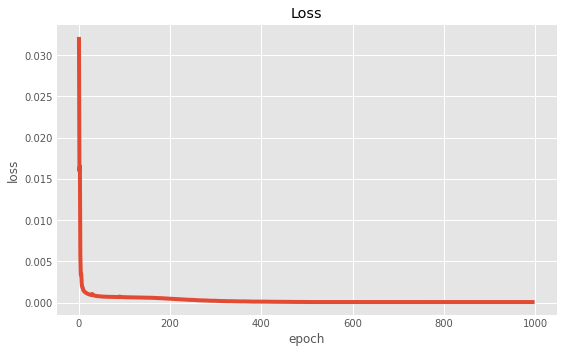

In [61]:
plt.style.use("ggplot")
plt.figure(figsize=(8,5))
sns.lineplot(x="epoch", y="loss", data=df)
plt.title("Loss")
plt.show()

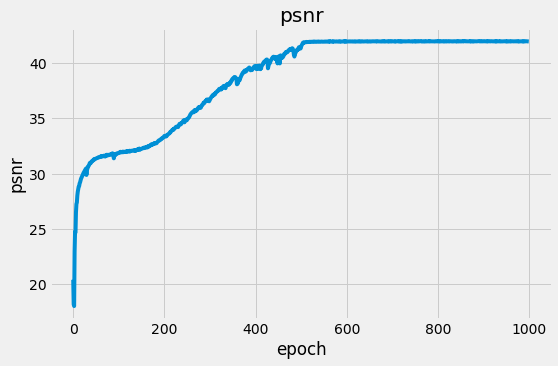

In [54]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(8,5))
sns.lineplot(x="epoch", y="psnr", data=df)
plt.title("psnr")
plt.show()

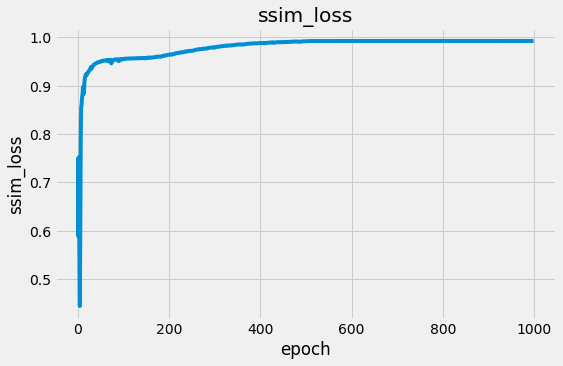

In [55]:
plt.style.use("fivethirtyeight")
plt.figure(figsize=(8,5))
sns.lineplot(x="epoch", y="ssim_loss", data=df)
plt.title("ssim_loss")
plt.show()

In [15]:
!zip -r Output.zip /content/Output/

  adding: content/Output/ (stored 0%)
  adding: content/Output/Output_BraTS20_Training_002_flair_80.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_82.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_51.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_62.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_59.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_66.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_79.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_78.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_64.png.png (deflated 2%)
  adding: content/Output/Output_BraTS20_Training_002_flair_40.png.png (deflated 3%)
  adding: content/Output/Output_BraTS20_Training_002_flair_69.png.png (deflated 2%)
  adding: content/Output/Output_BraTS2